In [1]:
import pandas as pd
import sqlite3
import kaggle
import os
import matplotlib.pyplot as plt
# %matplotlib inline
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
import seaborn as sns


from ETL_Pipeline import ETLPipeline

# Running the ETL pipeline
etl = ETLPipeline()
transformed_data, db_name, table_name = etl.run('../data/etl_data.db', 'etl_table')


---------------------------------------------------------------------------


2024-07-02 21:01:09,323 - INFO - Successfully extracted 'Crop Production' data


Dataset URL: https://www.kaggle.com/datasets/mdazizulkabirlovlu/all-countries-temperature-statistics-1970-2021


2024-07-02 21:01:10,463 - INFO - Successfully extracted 'Temperature Data'
2024-07-02 21:01:10,468 - INFO - Extraction completed.


---------------------------------------------------------------------------


2024-07-02 21:01:10,900 - INFO - Transformation completed.
2024-07-02 21:01:11,001 - INFO - Loading completed, data saved to database '../data/etl_data.db' in table 'etl_table'.
2024-07-02 21:01:11,002 - INFO - ETL process completed successfully.


In [2]:
transformed_data

,index,Country Name,Item,Element,Unit_x,Y1970,Y1971,Y1972,Y1973,Y1974,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,33,Algeria,Carrots and turnips,Area harvested,ha,3620.0,3570.0,3630.0,3640.0,3640.0,...,2.249,1.390,1.128,1.173,1.676,1.101,1.736,1.498,1.211,1.094
1,34,Algeria,Carrots and turnips,Yield,hg/ha,83749.0,69964.0,61579.0,62077.0,75434.0,...,2.249,1.390,1.128,1.173,1.676,1.101,1.736,1.498,1.211,1.094
2,35,Algeria,Carrots and turnips,Production,tonnes,30317.0,24977.0,22353.0,22596.0,27458.0,...,2.249,1.390,1.128,1.173,1.676,1.101,1.736,1.498,1.211,1.094
3,54,Algeria,Dates,Area harvested,ha,32000.0,58000.0,57000.0,57000.0,60000.0,...,2.249,1.390,1.128,1.173,1.676,1.101,1.736,1.498,1.211,1.094
4,55,Algeria,Dates,Yield,hg/ha,24770.0,24825.0,28083.0,25228.0,27928.0,...,2.249,1.390,1.128,1.173,1.676,1.101,1.736,1.498,1.211,1.094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2187,25011,Vanuatu,Coconuts,Yield,hg/ha,35294.0,38824.0,24118.0,28824.0,40294.0,...,0.832,0.654,0.342,0.649,0.554,0.536,1.102,1.032,0.445,0.803
2188,25012,Vanuatu,Coconuts,Production,tonnes,240000.0,264000.0,164000.0,196000.0,274000.0,...,0.832,0.654,0.342,0.649,0.554,0.536,1.102,1.032,0.445,0.803
2189,25025,Vanuatu,Maize,Area harvested,ha,850.0,900.0,950.0,1000.0,1000.0,...,0.832,0.654,0.342,0.649,0.554,0.536,1.102,1.032,0.445,0.803
2190,25026,Vanuatu,Maize,Yield,hg/ha,5294.0,5000.0,5263.0,5000.0,5000.0,...,0.832,0.654,0.342,0.649,0.554,0.536,1.102,1.032,0.445,0.803


In [3]:
# Define columns for each subset
Crop_columns = ["Country Name", 'Item', 'Element', 'Unit_x'] + ["Y" + str(i) for i in range(1970, 2020)]
Temp_columns = ['Country Name', 'Change ', 'Unit_y'] + [str(i) for i in range(1970, 2020)]


# Create the subsets
Crop_df = transformed_data[Crop_columns]
Temp_df = transformed_data[Temp_columns]



In [4]:
Yield_Crop_df = Crop_df[Crop_df['Element'] == 'Yield']
Yield_Crop_df

,Country Name,Item,Element,Unit_x,Y1970,Y1971,Y1972,Y1973,Y1974,Y1975,...,Y2010,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019
1,Algeria,Carrots and turnips,Yield,hg/ha,83749.0,69964.0,61579.0,62077.0,75434.0,72943.0,...,173799.0,178754.0,186803.0,200598.0,214396.0,209965.0,233145.0,239565.0,240724.0,240159.0
4,Algeria,Dates,Yield,hg/ha,24770.0,24825.0,28083.0,25228.0,27928.0,29762.0,...,40023.0,44710.0,48136.0,51501.0,56499.0,59342.0,61550.0,63144.0,64831.0,66793.0
7,Algeria,Grapes,Yield,hg/ha,42548.0,44638.0,29191.0,32926.0,35759.0,27058.0,...,80978.0,55883.0,73288.0,77822.0,77997.0,86098.0,81254.0,81441.0,72500.0,89149.0
10,Algeria,Maize,Yield,hg/ha,10235.0,8135.0,8528.0,11795.0,13506.0,18059.0,...,25827.0,23374.0,25583.0,33649.0,26165.0,39242.0,45129.0,13007.0,18409.0,41539.0
13,Algeria,Potatoes,Yield,hg/ha,62542.0,62150.0,53450.0,55950.0,66107.0,82059.0,...,270526.0,292806.0,304291.0,303218.0,299247.0,296099.0,304506.0,309524.0,310916.0,318011.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2178,Tokelau,Coconuts,Yield,hg/ha,50303.0,50000.0,50000.0,50000.0,50000.0,50000.0,...,68579.0,69783.0,71667.0,71667.0,72000.0,73423.0,75561.0,76824.0,78098.0,79376.0
2181,Tonga,Coconuts,Yield,hg/ha,108571.0,113699.0,138462.0,110000.0,131250.0,156250.0,...,145401.0,153777.0,162894.0,169639.0,174825.0,180961.0,189030.0,195207.0,201234.0,207438.0
2184,Tuvalu,Coconuts,Yield,hg/ha,11905.0,12069.0,10000.0,10000.0,12000.0,11818.0,...,9656.0,9587.0,9333.0,9514.0,9644.0,9662.0,9674.0,9668.0,9656.0,9647.0
2187,Vanuatu,Coconuts,Yield,hg/ha,35294.0,38824.0,24118.0,28824.0,40294.0,38235.0,...,40104.0,37500.0,38913.0,42935.0,36087.0,32870.0,32609.0,32623.0,33600.0,33683.0


In [5]:
# Keep only unique entries in column 'Country Name'
unique_Temp_df = Temp_df.drop_duplicates(subset=['Country Name']).reset_index(drop=True)

# Displaying the new DataFrame
unique_Temp_df.tail()

,Country Name,Change,Unit_y,1970,1971,1972,1973,1974,1975,1976,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
133,Solomon Islands,Surface Temperature Change,Degree Celsius,0.140,-0.130,-0.334,0.198,0.103,0.0490,-0.112,...,0.520,0.287,0.223,0.590,0.655,0.4430,0.785,0.579,0.6190,0.599
134,Tokelau,Surface Temperature Change,Degree Celsius,-0.392,-0.406,0.060,0.056,-0.343,-0.3610,0.118,...,1.025,0.682,0.578,0.744,0.755,0.8975,1.187,1.133,0.9495,1.238
135,Tonga,Surface Temperature Change,Degree Celsius,0.410,0.198,0.002,0.435,0.086,0.0580,-0.193,...,0.672,0.366,0.455,0.586,0.433,0.4800,1.004,0.797,0.6120,1.032
136,Tuvalu,Surface Temperature Change,Degree Celsius,-0.028,-0.258,-0.147,0.146,-0.381,0.0785,-0.070,...,0.978,0.855,0.661,0.732,0.696,0.8470,0.972,1.062,1.0240,1.127
137,Vanuatu,Surface Temperature Change,Degree Celsius,0.308,-0.005,-0.314,0.550,0.312,0.0430,-0.057,...,0.832,0.654,0.342,0.649,0.554,0.5360,1.102,1.032,0.4450,0.803


## Further Analysis

In [6]:
# Identify columns to keep as identifiers 
id_cols = ['Country Name', 'Unit_y', 'Change ']
melt_temp_df = pd.melt(unique_Temp_df, id_vars=id_cols, var_name='Year', value_name='Surface Temperature Change')
melt_temp_df['Year'] = pd.to_numeric(melt_temp_df['Year'])
melt_temp_df

,Country Name,Unit_y,Change,Year,Surface Temperature Change
0,Algeria,Degree Celsius,Surface Temperature Change,1970,0.114
1,Angola,Degree Celsius,Surface Temperature Change,1970,0.249
2,Benin,Degree Celsius,Surface Temperature Change,1970,0.343
3,Botswana,Degree Celsius,Surface Temperature Change,1970,0.641
4,Burkina Faso,Degree Celsius,Surface Temperature Change,1970,0.381
...,...,...,...,...,...
6895,Solomon Islands,Degree Celsius,Surface Temperature Change,2019,0.599
6896,Tokelau,Degree Celsius,Surface Temperature Change,2019,1.238
6897,Tonga,Degree Celsius,Surface Temperature Change,2019,1.032
6898,Tuvalu,Degree Celsius,Surface Temperature Change,2019,1.127


In [7]:

# Create animated choropleth map
fig = px.choropleth(melt_temp_df,
                    locations="Country Name",
                    locationmode='country names',
                    color="Surface Temperature Change",
                    hover_name="Country Name",
                    animation_frame="Year",
                    title="Annual Surface Temperature Change",
                    projection='natural earth',
                    #color_continuous_scale=px.colors.sequential.Plasma
                    color_continuous_scale='ylorbr',)

# Add titles and labels
fig.update_layout(geo=dict(showcoastlines=True),
                  coloraxis_colorbar=dict(title="Surface Temp Change °C"))

# Show the plot
fig.show()

In [8]:

avg_T = melt_temp_df['Surface Temperature Change'].mean().round(2)

# Plotting the heatmap
fig = px.choropleth_mapbox(melt_temp_df,
                            geojson="https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json",
                            locations='Country Name',
                            featureidkey="properties.name",
                            color='Surface Temperature Change',
                            hover_name='Country Name',
                            color_continuous_scale='ylorbr',
                            animation_frame="Year",
                            title=f'Annual Mean Surface Temperature Change in 2019 (Avg. {avg_T})',
                            labels={'Surface Temperature Change': 'Mean Surface Temperature Change (°C)'},
                            mapbox_style="carto-positron",  # Using mapbox style
                            zoom=0.2,  # Zoom level
                            center={"lat": 0, "lon": 0},  # Center of the map
                            opacity=0.6)  # Opacity of the map


# Add titles and labels
fig.update_layout(geo=dict(showcoastlines=True),
                  coloraxis_colorbar=dict(title=f"Temp.°C"))
                    


# Show the figure
fig.show()


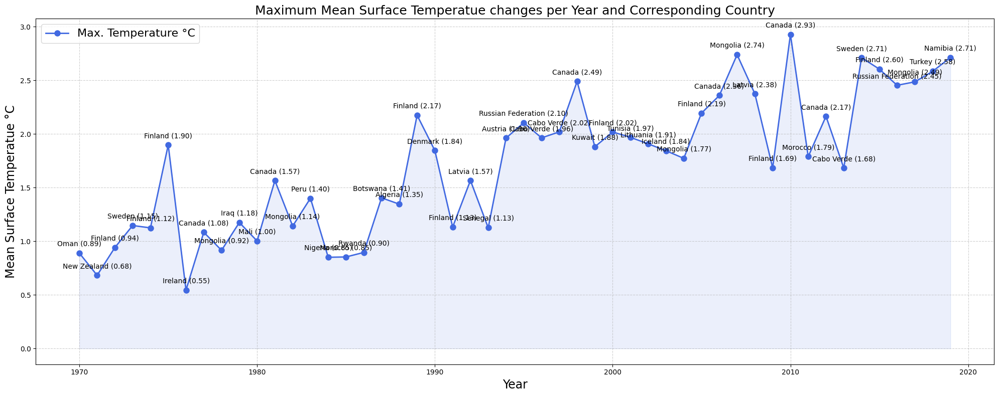

In [9]:
# Max mean surface temperature year-wise across countries

# Identify maximum value for each year
max_values = melt_temp_df.loc[melt_temp_df.groupby('Year')['Surface Temperature Change'].idxmax()]

# Select relevant columns
max_values = max_values[['Year', 'Country Name', 'Surface Temperature Change']]


# Plotting the maximum values per year
plt.figure(figsize=(20, 8))
plt.plot(max_values['Year'], max_values['Surface Temperature Change'], marker='o', linestyle='-', color='royalblue', markersize=8, linewidth=2)
plt.fill_between(max_values['Year'], max_values['Surface Temperature Change'], color='royalblue', alpha=0.1)

# Add labels and title
plt.xlabel('Year', fontsize=17)
plt.ylabel('Mean Surface Temperatue °C', fontsize=17)
plt.title('Maximum Mean Surface Temperatue changes per Year and Corresponding Country', fontsize=18)
plt.grid(True, linestyle='--', alpha=0.6)


# Annotate the points with the corresponding country names and values
for i, row in max_values.iterrows():
    plt.annotate(f"{row['Country Name']} ({row['Surface Temperature Change']:.2f})", 
                 (row['Year'], row['Surface Temperature Change']),
                 textcoords="offset points", xytext=(0, 10), ha='center', fontsize=10, color='black')

# Add a legend for better clarity
plt.legend(['Max. Temperature °C'], loc='upper left', fontsize=16)

# Improve the layout
plt.tight_layout()

# Save the figure with high DPI
plt.savefig('Max_mean_surface_temp.png', dpi=300)


# Show the plot
plt.show()




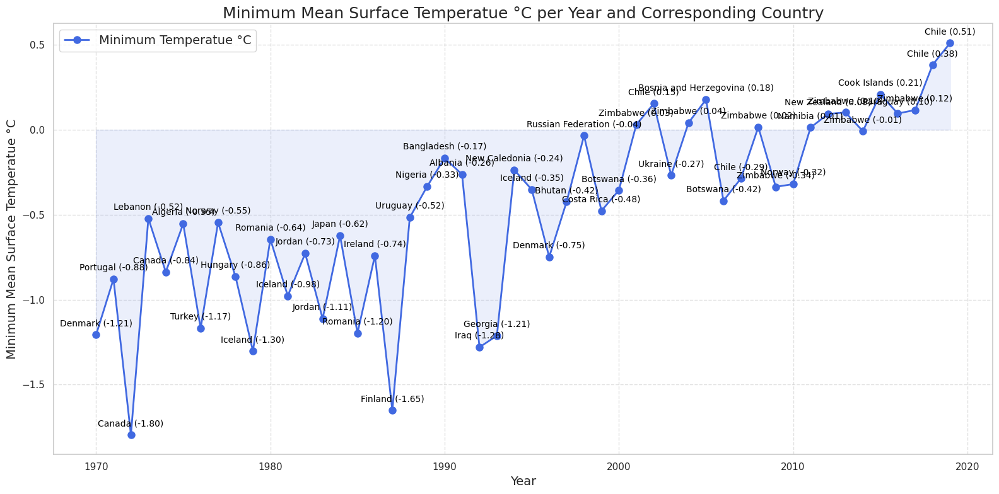

In [10]:
# Min mean surface temperature year-wise across countries

# Set seaborn style
sns.set(style='whitegrid')


# Convert 'Year' to numeric type
melt_temp_df['Year'] = melt_temp_df['Year'].astype(int)

# Identify minimum value for each year
min_values = melt_temp_df.loc[melt_temp_df.groupby('Year')['Surface Temperature Change'].idxmin()]

# Select relevant columns
min_values = min_values[['Year', 'Country Name', 'Surface Temperature Change']]

# Clear the figure
plt.clf()

# Close the figure
plt.close()

# Plotting the minimum values per year
plt.figure(figsize=(16, 8))
plt.plot(min_values['Year'], min_values['Surface Temperature Change'], marker='o', linestyle='-', color='royalblue', markersize=8, linewidth=2)
plt.fill_between(min_values['Year'], min_values['Surface Temperature Change'], color='royalblue', alpha=0.1)

# Add labels and title
plt.xlabel('Year', fontsize=14)
plt.ylabel('Minimum Mean Surface Temperatue °C', fontsize=14)
plt.title('Minimum Mean Surface Temperatue °C per Year and Corresponding Country', fontsize=18)
plt.grid(True, linestyle='--', alpha=0.6)

# Annotate the points with the corresponding country names and values
for i, row in min_values.iterrows():
    plt.annotate(f"{row['Country Name']} ({row['Surface Temperature Change']:.2f})", 
                 (row['Year'], row['Surface Temperature Change']),
                 textcoords="offset points", xytext=(0, 10), ha='center', fontsize=10, color='black')

# Add a legend for better clarity
plt.legend(['Minimum Temperatue °C'], loc='upper left', fontsize=14)

# Improve the layout
plt.tight_layout()

# Show the plot
plt.show()


In [11]:
# 'Pakistan', 'India', 'Germany', 'Italy', 'Spain', 'Turkey', 'Canada', 'Colombia', 'Australia', 'Saudi Arabia', 'United Arab Emirates', 'Oman', 'Iraq'

import plotly.graph_objs as go

# Define the countries to be included in the dropdown
countries = melt_temp_df['Country Name'].unique()

# Create traces for each country
traces = []
for country in countries:
    country_data = melt_temp_df[melt_temp_df['Country Name'] == country]
    trace = go.Scatter(
        x=country_data['Year'],
        y=country_data['Surface Temperature Change'],
        mode='lines+markers',
        name=country,
        visible=True if country in ['Pakistan', 'India', 'Germany', 'Turkey', 'Canada', 'Finland', 'Colombia', 'Australia', 'United Arab Emirates', 'Iraq'] else False
    )
    traces.append(trace)

# Create layout with dropdown menu
layout = go.Layout(
    title='Mean Surface Temperature Change Per Country Over Time',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Mean Surface Temperature Change'),
    hovermode='x',
    width=1200,  # Increase width
    height=500,  # Increase height
#     updatemenus=[
#         {
#             'buttons': [
#                 {'label': 'Show All',
#                  'method': 'update',
#                  'args': [{'visible': [True] * len(countries)}]},
#                 {'label': 'India',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'India' for country in countries]}]},
#                 {'label': 'Pakistan',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Pakistan' for country in countries]}]},
#                 {'label': 'Germany',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Germany' for country in countries]}]},
#                 {'label': 'Italy',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Italy' for country in countries]}]},
#                 {'label': 'Spain',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Spain' for country in countries]}]},
#                 {'label': 'Turkey',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Turkey' for country in countries]}]},
#                 {'label': 'Canada',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Canada' for country in countries]}]},
#                 {'label': 'Colombia',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Colombia' for country in countries]}]},
#                 {'label': 'Australia',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Australia' for country in countries]}]},
#                 {'label': 'Saudi Arabia',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Saudi Arabia' for country in countries]}]},
#                 {'label': 'United Arab Emirates',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'United Arab Emirates' for country in countries]}]},
#                 {'label': 'Oman',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Oman' for country in countries]}]},
#                 {'label': 'Iraq',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Iraq' for country in countries]}]},
#                 {'label': 'Finland',
#                  'method': 'update',
#                  'args': [{'visible': [country == 'Finland' for country in countries]}]},
#             ],
#             'direction': 'down',
#             'showactive': True,
#         }
#     ]

)

# Combine traces and layout into a Figure
fig = go.Figure(data=traces, layout=layout)

fig.show()


In [12]:
'Pakistan', 'India', 'Germany', 'Italy', 'Spain', 'Turkey', 'Canada', 'Colombia', 'Australia', 'Saudi Arabia', 'United Arab Emirates', 'Oman', 'Iraq', 'Finland' 

('Pakistan',
 'India',
 'Germany',
 'Italy',
 'Spain',
 'Turkey',
 'Canada',
 'Colombia',
 'Australia',
 'Saudi Arabia',
 'United Arab Emirates',
 'Oman',
 'Iraq',
 'Finland')

In [13]:

countries = ['Pakistan', 'India', 'Germany', 'Turkey', 'Canada', 'Finland', 'Colombia', 'Australia', 'United Arab Emirates', 'Iraq']

# Define colors for each country
color_mapping = {
    'Pakistan': 'blue',
    'India': 'orange',
    'Germany': 'green',
    'Turkey': 'red',
    'Canada': 'purple',
    'Finland': 'brown',
    'Colombia': 'pink',
    'Australia': 'gray',
    'United Arab Emirates': 'yellow',
    'Iraq': 'cyan'
}

# Create traces for each country
traces = []
for country in countries:
    country_data = melt_temp_df[melt_temp_df['Country Name'] == country]
    trace = go.Scatter(
        x=country_data['Year'],
        y=country_data['Surface Temperature Change'],
        mode='lines+markers',
        name=country,
        visible=True if country in color_mapping.keys() else False,
        line=dict(color=color_mapping.get(country, 'blue')),  # Assign color from mapping
        marker=dict(color=color_mapping.get(country, 'blue'))  # Assign color from mapping
    )
    traces.append(trace)

# Create layout with dropdown menu
layout = go.Layout(
    title='Mean Surface Temperature Change (°C) Per Country Over Time',
    xaxis=dict(title='Year', showgrid=True, gridcolor='LightGray'),
    yaxis=dict(title='Mean Surface Temperature Change', showgrid=True,  gridcolor='LightGray'),
    hovermode='x',
    width=1200,  # Increase width
    height=700,  # Increase height
    legend=dict(
        x=0.2, y=1.06,  # Centered above the plot
        orientation='h',
        traceorder='normal',
        font=dict(
            #family='sans-serif',
            size=13,
            color='black'
        ),
        bgcolor='white',
        bordercolor='Black',
        borderwidth=1
    ),
    plot_bgcolor='white',  # Set figure background color to white

)

# Combine traces and layout into a Figure
fig = go.Figure(data=traces, layout=layout)

fig.show()


In [14]:

# Countries of interest
countries = ['Pakistan', 'Germany', 'Turkey', 'Australia']

# Define colors for each country
# color_mapping = {
#     'Pakistan': 'blue',
#     'India': 'orange',
#     'Germany': 'green',
#     'Turkey': 'red',
#     'Canada': 'purple',
#     'Finland': 'brown',
#     'Colombia': 'pink',
#     'Australia': 'gray',
#     'United Arab Emirates': 'yellow',
#     'Iraq': 'cyan'
# }

color_mapping = {
    'Pakistan': 'blue',
    'Germany': 'orange',
    'Turkey': 'green',
    'Australia': 'red',
}


# Create traces for each country with average temperature in the legend
traces = []
for country in countries:
    country_data = melt_temp_df[melt_temp_df['Country Name'] == country]
    avg_temp_change = country_data['Surface Temperature Change'].mean()
    trace = go.Scatter(
        x=country_data['Year'],
        y=country_data['Surface Temperature Change'],
        mode='lines+markers',
        name=f"{country} (Avg: {avg_temp_change:.2f}°C)",  # Add average temperature change to the legend
        line=dict(color=color_mapping.get(country, 'blue')),  # Assign color from mapping
        marker=dict(color=color_mapping.get(country, 'blue'))  # Assign color from mapping
    )
    traces.append(trace)

# Create layout with updated legend
layout = go.Layout(
    title='Mean Surface Temperature Change Per Country Over Time',
    xaxis=dict(title='Year', showgrid=True, gridcolor='LightGray'),
    yaxis=dict(title='Mean Surface Temperature Change', showgrid=True, gridcolor='LightGray'),
    hovermode='x',
    width=1200,  # Increase width
    height=700,  # Increase height
    legend=dict(
        x=0.02, y=1,  # Centered above the plot
        orientation='v',
        traceorder='normal',
        font=dict(
            size=13,
            color='black'
        ),
        bgcolor='white',
        bordercolor='Black',
        borderwidth=1
    ),
    plot_bgcolor='white'  # Set figure background color to white
)

# Combine traces and layout into a Figure
fig = go.Figure(data=traces, layout=layout)

fig.show()


## Crop Data Analysis

In [15]:
# Identify columns to keep as identifiers 
id_cols = ['Country Name', 'Item', 'Element', 'Unit_x']
melt_Crop_df = pd.melt(Yield_Crop_df, id_vars=id_cols, var_name='Year', value_name='Crop_Production')
melt_Crop_df['Year'] = melt_Crop_df['Year'].str.replace('^Y', '', regex=True)
melt_Crop_df['Year'] = pd.to_numeric(melt_Crop_df['Year'])
melt_Crop_df.head(9)

,Country Name,Item,Element,Unit_x,Year,Crop_Production
0,Algeria,Carrots and turnips,Yield,hg/ha,1970,83749.0
1,Algeria,Dates,Yield,hg/ha,1970,24770.0
2,Algeria,Grapes,Yield,hg/ha,1970,42548.0
3,Algeria,Maize,Yield,hg/ha,1970,10235.0
4,Algeria,Potatoes,Yield,hg/ha,1970,62542.0
5,Algeria,"Rice, paddy",Yield,hg/ha,1970,15810.0
6,Algeria,Wheat,Yield,hg/ha,1970,6245.0
7,Angola,Maize,Yield,hg/ha,1970,9120.0
8,Angola,Potatoes,Yield,hg/ha,1970,62963.0


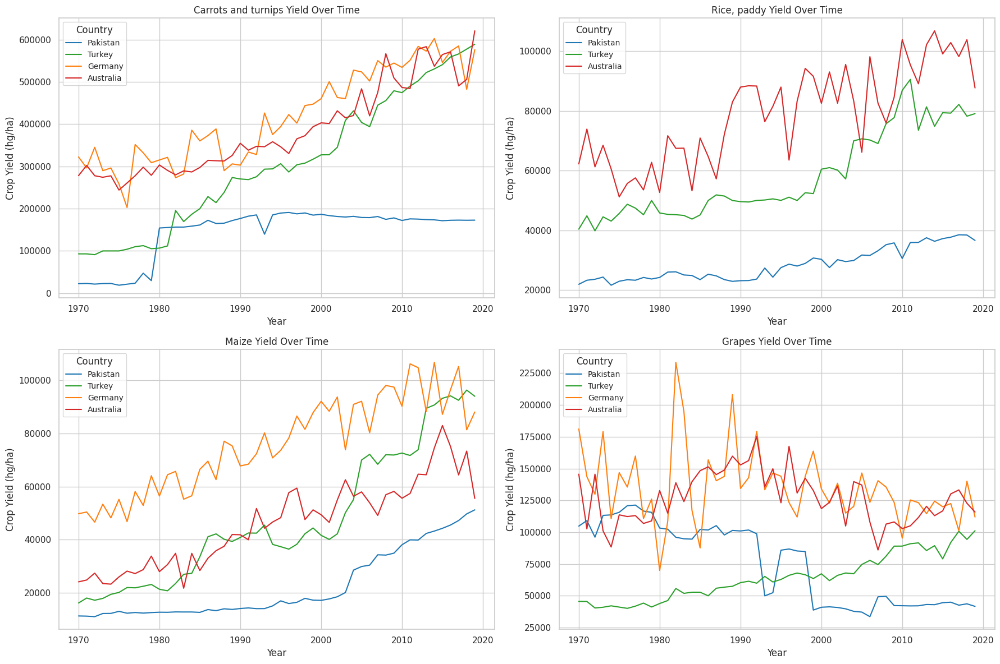

In [16]:

# Countries of interest
# countries_to_plot = ['Pakistan', 'India', 'Germany', 'Turkey', 'Canada', 'Finland', 'Colombia', 'Australia', 'United Arab Emirates', 'Iraq']

countries_to_plot = ['Pakistan', 'Germany', 'Turkey', 'Australia']

# Six crops of interest
crops_of_interest = ['Carrots and turnips', 'Rice, paddy', 'Maize', 'Grapes']

# Filter the DataFrame for the crops and countries of interest
filtered_df = melt_Crop_df[melt_Crop_df['Item'].isin(crops_of_interest) & melt_Crop_df['Country Name'].isin(countries_to_plot)]

# Define a color map for the countries
colors = plt.get_cmap('tab10')  # Or choose another colormap like 'viridis', 'plasma', etc.
country_colors = {country: colors(i) for i, country in enumerate(countries_to_plot)}

# Create a figure and array of subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharey=False)
axes = axes.flatten()

# Plot each crop's production data
for i, crop in enumerate(crops_of_interest):
    ax = axes[i]
    crop_df = filtered_df[filtered_df['Item'] == crop]
    
    for country in crop_df['Country Name'].unique():
        country_df = crop_df[crop_df['Country Name'] == country]
        ax.plot(country_df['Year'], country_df['Crop_Production'], label=country, color=country_colors[country])
    
    ax.set_title(f"{crop} Yield Over Time")
    ax.set_xlabel('Year')
    ax.set_ylabel('Crop Yield (hg/ha)')
    ax.legend(title="Country", fontsize='small', loc='upper left')

# Adjust layout
plt.tight_layout()
plt.savefig('crops_yield.png', dpi=200)

plt.show()



In [22]:

# import pandas as pd
# import plotly.express as px
# from PIL import Image
# import io
# # Load GeoJSON data (world countries)
# geojson = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json"

# # Initialize an empty list to store frames
# frames = []

# # Generate frames for each year
# for year in agg_df['Year'].unique():
#     df_year = agg_df[agg_df['Year'] == year]
    
#     fig = px.choropleth_mapbox(df_year,
#                                geojson=geojson,
#                                locations='Country Name',
#                                featureidkey="properties.name",
#                                color='Crop_Production',
#                                hover_name='Country Name',
#                                color_continuous_scale='YlGnBu',
#                                title=f'Crop Production {year}',
#                                labels={'Crop_Production': 'Crop Production (tons)'},
#                                mapbox_style="carto-positron",
#                                zoom=0,
#                                center={"lat": 0, "lon": 0},
#                                opacity=0.5)
    
#     fig.update_layout(geo=dict(showcoastlines=True),
#                       coloraxis_colorbar=dict(title="Crop Production (tons)"))
    
#     # Save each frame as an image (png)
#     img_bytes = fig.to_image(format="png")
#     img = Image.open(io.BytesIO(img_bytes))
#     frames.append(img)

# # Save frames as a GIF
# frames[0].save('crop_production_animation.gif',
#                save_all=True, append_images=frames[1:], optimize=False, duration=500, loop=0)


## Correlation

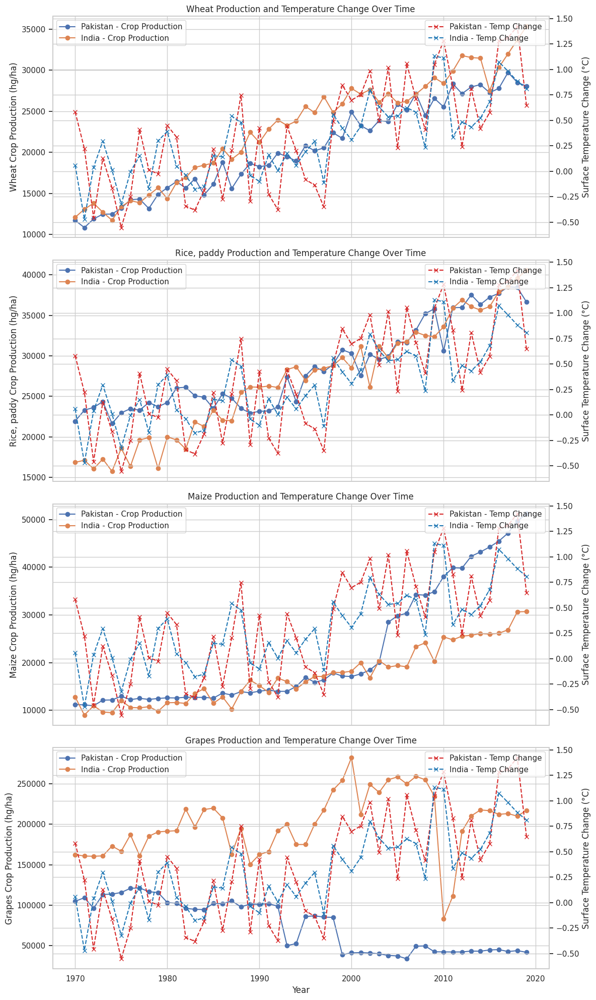

In [17]:
import matplotlib.pyplot as plt

# Assuming you have already defined and filtered melt_temp_df and melt_Crop_df as per previous codes

# Countries of interest
countries_to_plot = ['Pakistan', 'India']

# Six crops of interest
crops_of_interest = ['Wheat', 'Rice, paddy', 'Maize', 'Grapes']

# Create a figure and array of subplots
fig, axes = plt.subplots(len(crops_of_interest), 1, figsize=(12, 20), sharex=True)

# Iterate over each crop of interest
for idx, crop in enumerate(crops_of_interest):
    ax = axes[idx]
#     print(ax)
    
    # Filter crop data for the current crop
    crop_df = melt_Crop_df[(melt_Crop_df['Item'] == crop) & melt_Crop_df['Country Name'].isin(countries_to_plot)]
    
    # Plot crop production yield on primary y-axis for each country
    for country in countries_to_plot:
        country_df = crop_df[crop_df['Country Name'] == country]
        ax.plot(country_df['Year'], country_df['Crop_Production'], label=f"{country} - Crop Production", linestyle='-', marker='o')

    ax.set_ylabel(f'{crop} Crop Production (hg/ha)')
    ax.legend()

    # Create secondary y-axis for temperature change (assuming same temperature data for both countries)
    ax_temp = ax.twinx()
    
    # Filter temperature data for the first country (Pakistan)
    temp_df = melt_temp_df[melt_temp_df['Country Name'] == 'Pakistan']
    ax_temp.plot(temp_df['Year'], temp_df['Surface Temperature Change'], label=f"Pakistan - Temp Change", linestyle='--', marker='x', color='tab:red')
    
    # Filter temperature data for the second country (India)
    temp_df = melt_temp_df[melt_temp_df['Country Name'] == 'India']
    ax_temp.plot(temp_df['Year'], temp_df['Surface Temperature Change'], label=f"India - Temp Change", linestyle='--', marker='x', color='tab:blue')
    
    ax_temp.set_ylabel('Surface Temperature Change (°C)')
    ax_temp.legend(loc='upper right')

    # Set title for the subplot
    ax.set_title(f"{crop} Production and Temperature Change Over Time")

# Set common x-axis label
axes[-1].set_xlabel('Year')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


In [35]:
###########################

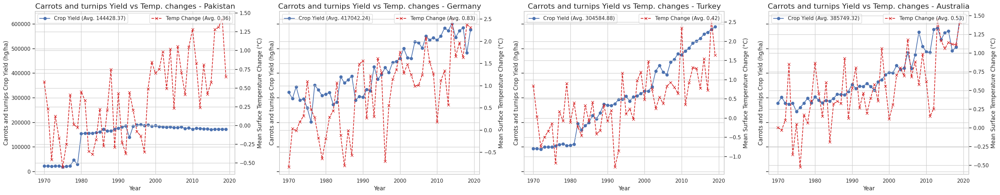

In [18]:

# Assuming you have already defined and filtered melt_temp_df and melt_Crop_df as per previous codes

# Single crop of interest
crop_of_interest = 'Carrots and turnips'

# Countries of interest
countries_to_plot = ['Pakistan', 'Germany', 'Turkey', 'Australia']

# Create a figure with subplots
fig, axes = plt.subplots(1, len(countries_to_plot), figsize=(30, 6), sharey=True)

# Iterate over each country of interest
for i, country in enumerate(countries_to_plot):
    ax = axes[i]
    
    # Filter crop data for the current crop and country
    crop_df = melt_Crop_df[(melt_Crop_df['Item'] == crop_of_interest) & (melt_Crop_df['Country Name'] == country)]
    
    avg_crop_yield = (crop_df['Crop_Production'].mean()).round(2)
    
    
    # Plot crop production yield
    ax.plot(crop_df['Year'], crop_df['Crop_Production'], label=f"Crop Yield (Avg. {avg_crop_yield})", linestyle='-', marker='o')
    
    ax.set_title(f"{crop_of_interest} Yield vs Temp. changes - {country}", size=16)
    ax.set_xlabel('Year')
    ax.set_ylabel(f'{crop_of_interest} Crop Yield (hg/ha)')
    ax.legend(loc='upper left')
    
    # Add secondary y-axis for temperature change
    ax_temp = ax.twinx()
    
    # Filter temperature data for the current country
    temp_df = melt_temp_df[melt_temp_df['Country Name'] == country]
    
    avg_temp_change = (temp_df['Surface Temperature Change'].mean()).round(2)

    ax_temp.plot(temp_df['Year'], temp_df['Surface Temperature Change'], label=f"Temp Change (Avg. {avg_temp_change})", linestyle='--', marker='x', color='tab:red')
    
    ax_temp.set_ylabel('Mean Surface Temperature Change (°C)')
    ax_temp.legend(loc='upper right')

# Adjust layout
plt.tight_layout()
plt.savefig('CarrotsTurnips_temp.png', dpi=200)

plt.show()


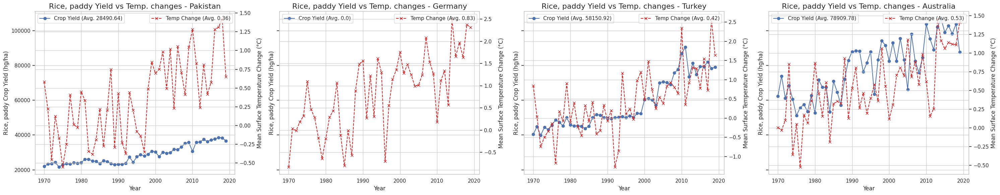

In [27]:
import matplotlib.pyplot as plt

# Assuming you have already defined and filtered melt_temp_df and melt_Crop_df as per previous codes

# Single crop of interest
crop_of_interest = 'Rice, paddy'

# Countries of interest
countries_to_plot = ['Pakistan', 'Germany', 'Turkey', 'Australia']

# Create a figure with subplots
fig, axes = plt.subplots(1, len(countries_to_plot), figsize=(30, 6), sharey=True)

# Iterate over each country of interest
for i, country in enumerate(countries_to_plot):
    ax = axes[i]
    
    # Filter crop data for the current crop and country
    crop_df = melt_Crop_df[(melt_Crop_df['Item'] == crop_of_interest) & (melt_Crop_df['Country Name'] == country)]
    
    avg_crop_yield = (crop_df['Crop_Production'].mean())
    
    if avg_crop_yield > 0:
        avg_crop_yield = avg_crop_yield.round(2)
    else:
        avg_crop_yield = 0.00
    
    # Plot crop production yield
    ax.plot(crop_df['Year'], crop_df['Crop_Production'], label=f"Crop Yield (Avg. {avg_crop_yield})", linestyle='-', marker='o')
    
    ax.set_title(f"{crop_of_interest} Yield vs Temp. changes - {country}", size=16)
    ax.set_xlabel('Year')
    ax.set_ylabel(f'{crop_of_interest} Crop Yield (hg/ha)')
    ax.legend(loc='upper left')
    
    # Add secondary y-axis for temperature change
    ax_temp = ax.twinx()
    
    # Filter temperature data for the current country
    temp_df = melt_temp_df[melt_temp_df['Country Name'] == country]
    
    avg_temp_change = (temp_df['Surface Temperature Change'].mean()).round(2)
    
    ax_temp.plot(temp_df['Year'], temp_df['Surface Temperature Change'], label=f"Temp Change (Avg. {avg_temp_change})", linestyle='--', marker='x', color='tab:red')
    
    ax_temp.set_ylabel('Mean Surface Temperature Change (°C)')
    ax_temp.legend(loc='upper right')

# Adjust layout
plt.tight_layout()
plt.savefig('RicePaddy_temp.png', dpi=200)

plt.show()


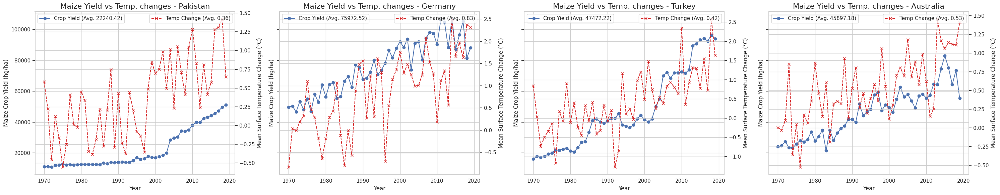

In [19]:
import matplotlib.pyplot as plt

# Assuming you have already defined and filtered melt_temp_df and melt_Crop_df as per previous codes

# Single crop of interest
crop_of_interest = 'Maize'

# Countries of interest
countries_to_plot = ['Pakistan', 'Germany', 'Turkey', 'Australia']

# Create a figure with subplots
fig, axes = plt.subplots(1, len(countries_to_plot), figsize=(30, 6), sharey=True)

# Iterate over each country of interest
for i, country in enumerate(countries_to_plot):
    ax = axes[i]
    
    # Filter crop data for the current crop and country
    crop_df = melt_Crop_df[(melt_Crop_df['Item'] == crop_of_interest) & (melt_Crop_df['Country Name'] == country)]
    
    avg_crop_yield = (crop_df['Crop_Production'].mean()).round(2)
    
    # Plot crop production yield
    ax.plot(crop_df['Year'], crop_df['Crop_Production'], label=f"Crop Yield (Avg. {avg_crop_yield})", linestyle='-', marker='o')
    
    ax.set_title(f"{crop_of_interest} Yield vs Temp. changes - {country}", size=16)
    ax.set_xlabel('Year')
    ax.set_ylabel(f'{crop_of_interest} Crop Yield (hg/ha)')
    ax.legend(loc='upper left')
    
    # Add secondary y-axis for temperature change
    ax_temp = ax.twinx()
    
    # Filter temperature data for the current country
    temp_df = melt_temp_df[melt_temp_df['Country Name'] == country]
    
    avg_temp_change = (temp_df['Surface Temperature Change'].mean()).round(2)
    
    ax_temp.plot(temp_df['Year'], temp_df['Surface Temperature Change'], label=f"Temp Change (Avg. {avg_temp_change})", linestyle='--', marker='x', color='tab:red')
    
    ax_temp.set_ylabel('Mean Surface Temperature Change (°C)')
    ax_temp.legend(loc='upper right')

# Adjust layout
plt.tight_layout()
plt.savefig('Maize_temp.png', dpi=200)

plt.show()


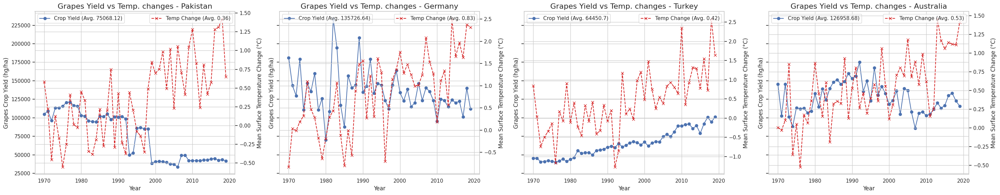

In [29]:
import matplotlib.pyplot as plt

# Assuming you have already defined and filtered melt_temp_df and melt_Crop_df as per previous codes

# Single crop of interest
crop_of_interest = 'Grapes'

# Countries of interest
countries_to_plot = ['Pakistan', 'Germany', 'Turkey', 'Australia']

# Create a figure with subplots
fig, axes = plt.subplots(1, len(countries_to_plot), figsize=(30, 6), sharey=True)

# Iterate over each country of interest
for i, country in enumerate(countries_to_plot):
    ax = axes[i]
    
    # Filter crop data for the current crop and country
    crop_df = melt_Crop_df[(melt_Crop_df['Item'] == crop_of_interest) & (melt_Crop_df['Country Name'] == country)]
    
    avg_crop_yield = (crop_df['Crop_Production'].mean()).round(2)
    
    # Plot crop production yield
    ax.plot(crop_df['Year'], crop_df['Crop_Production'], label=f"Crop Yield (Avg. {avg_crop_yield})", linestyle='-', marker='o')
    
    ax.set_title(f"{crop_of_interest} Yield vs Temp. changes - {country}", size=16)
    ax.set_xlabel('Year')
    ax.set_ylabel(f'{crop_of_interest} Crop Yield (hg/ha)')
    ax.legend(loc='upper left')
    
    # Add secondary y-axis for temperature change
    ax_temp = ax.twinx()
    
    # Filter temperature data for the current country
    temp_df = melt_temp_df[melt_temp_df['Country Name'] == country]
    
    avg_temp_change = (temp_df['Surface Temperature Change'].mean()).round(2)
    
    ax_temp.plot(temp_df['Year'], temp_df['Surface Temperature Change'], label=f"Temp Change (Avg. {avg_temp_change})", linestyle='--', marker='x', color='tab:red')
    
    ax_temp.set_ylabel('Mean Surface Temperature Change (°C)')
    ax_temp.legend(loc='upper right')

# Adjust layout
plt.tight_layout()
plt.savefig('Grapes_temp.png', dpi=200)

plt.show()


In [ ]:
##############################################

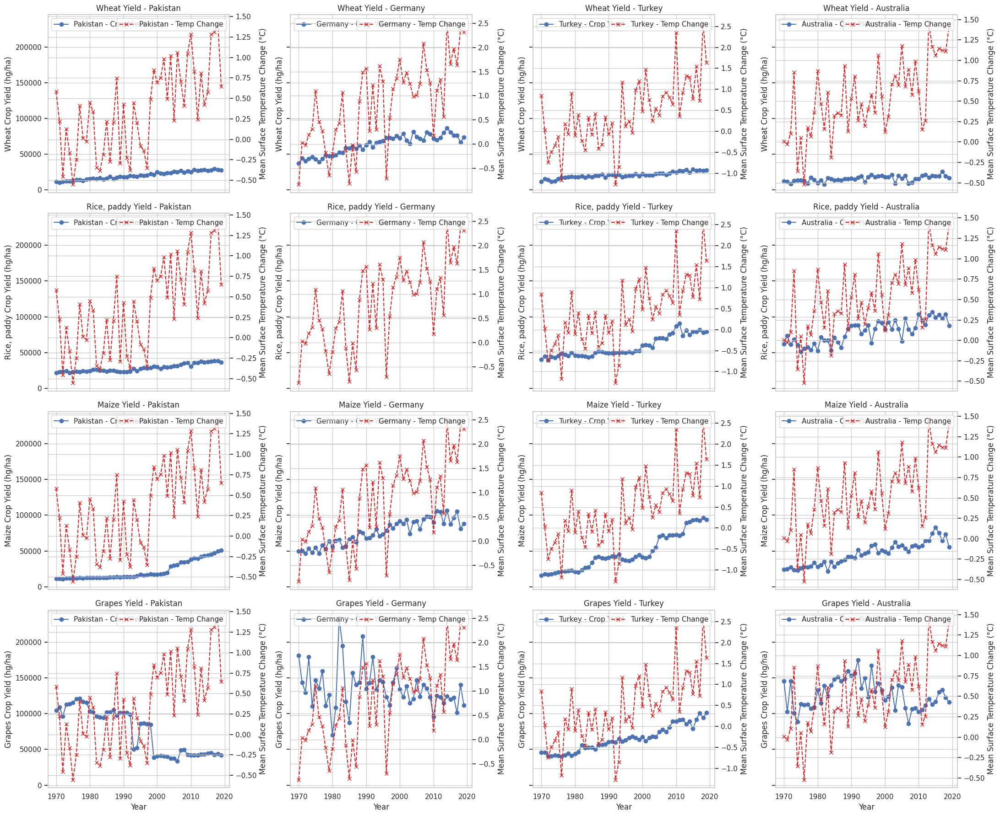

In [88]:
import matplotlib.pyplot as plt


# Countries of interest
countries_to_plot = ['Pakistan', 'Germany', 'Turkey', 'Australia']
# Six crops of interest
crops_of_interest = ['Wheat', 'Rice, paddy', 'Maize', 'Grapes']

# Create a figure with subplots
fig, axes = plt.subplots(len(crops_of_interest), len(countries_to_plot), figsize=(22, 18), sharey=True, sharex=True)

# Iterate over each crop of interest
for i, crop in enumerate(crops_of_interest):
    # Filter crop data for the current crop
    crop_df = melt_Crop_df[(melt_Crop_df['Item'] == crop) & melt_Crop_df['Country Name'].isin(countries_to_plot)]
    
    # Iterate over each country for the current crop
    for j, country in enumerate(countries_to_plot):
        ax = axes[i, j]
        
        # Plot crop production yield
        country_df = crop_df[crop_df['Country Name'] == country]
        ax.plot(country_df['Year'], country_df['Crop_Production'], label=f"{country} - Crop Yield", linestyle='-', marker='o')
        
        ax.set_title(f"{crop} Yield - {country}")
        ax.set_ylabel(f'{crop} Crop Yield (hg/ha)')
        ax.legend(loc='upper left')
        
        # Add secondary y-axis for temperature change
        ax_temp = ax.twinx()
        
        # Filter temperature data for the current country
        temp_df = melt_temp_df[melt_temp_df['Country Name'] == country]
        ax_temp.plot(temp_df['Year'], temp_df['Surface Temperature Change'], label=f"{country} - Temp Change", linestyle='--', marker='x', color='tab:red')
        
        ax_temp.set_ylabel('Mean Surface Temperature Change (°C)')
        ax_temp.legend(loc='upper right')

# fig.suptitle('Crop Production and Temperature Change Over Time for Different Countries', fontsize=16)
        
        
# Set common x-axis label
axes[-1, 0].set_xlabel('Year')
axes[-1, 1].set_xlabel('Year')
axes[-1, 2].set_xlabel('Year')
axes[-1, 3].set_xlabel('Year')


# Adjust layout
plt.tight_layout()

# plt.savefig('correlation.png', dpi=300)

plt.show()
